# **Segunda instancia de evaluación - Taller de Programación**
#### Alumna: Cecilia Guillamet Chargue


## 1. Importación del archivo de datos



In [1]:
# especifico la ruta de los datos
!wget https://archive.ics.uci.edu/ml/machine-learning-databases/00222/bank.zip

--2022-08-13 19:03:00--  https://archive.ics.uci.edu/ml/machine-learning-databases/00222/bank.zip
Resolving archive.ics.uci.edu (archive.ics.uci.edu)... 128.195.10.252
Connecting to archive.ics.uci.edu (archive.ics.uci.edu)|128.195.10.252|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 579043 (565K) [application/x-httpd-php]
Saving to: ‘bank.zip’

bank.zip            100%[===================>] 565.47K   875KB/s    in 0.6s    

2022-08-13 19:03:05 (875 KB/s) - ‘bank.zip’ saved [579043/579043]



In [2]:
# Descompresion del archivo
!unzip /content/bank.zip

Archive:  /content/bank.zip
  inflating: bank-full.csv           
  inflating: bank-names.txt          
  inflating: bank.csv                


## 2. Carga del archivo .csv y descriptiva inicial del conjunto de datos

In [3]:
# Importación de librería
import pandas as pd 

In [4]:
# lectura del conjunto de datos
df = pd.read_csv('/content/bank-full.csv', sep = ';')

In [5]:
df.head() # observación de las primeras 5 filas

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [6]:
df.shape # dimensiones del conjunto de datos

(45211, 17)

In [7]:
df.dtypes #tipos de datos de las columnas del conjunto de datos

age           int64
job          object
marital      object
education    object
default      object
balance       int64
housing      object
loan         object
contact      object
day           int64
month        object
duration      int64
campaign      int64
pdays         int64
previous      int64
poutcome     object
y            object
dtype: object

## 3. Profiling report y análisis descriptivo

In [ ]:
# importación de libreria e instalacion del profiling
import sys
!{sys.executable} -m pip install -U pandas-profiling[notebook]
!jupyter nbextension enable --py widgetsnbextension

In [ ]:
# Instalación profiling report
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [ ]:
# Instalación de librería
!pip install MarkupSafe==2.0.1

In [11]:
# Importación del profile report de la librería
from pandas_profiling import ProfileReport

In [12]:
# realización del profile report
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]



*   No marca valores faltantes, pero en el df.head() había unknown (REVISAR)
*   balance y previous tienen muchos ceros



In [13]:
# Medidas de tendencia central y dispersión para las variables cuantitativas
df.describe()

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000




*   Diferencia entre la media y la mediana para balance, duration y pdays



In [14]:
# Medidas las variables cualitativas
df.describe(include = 'object')

,job,marital,education,default,housing,loan,contact,month,poutcome,y
count,45211,45211,45211,45211,45211,45211,45211,45211,45211,45211
unique,12,3,4,2,2,2,3,12,4,2
top,blue-collar,married,secondary,no,yes,no,cellular,may,unknown,no
freq,9732,27214,23202,44396,25130,37967,29285,13766,36959,39922




*   Moda para poutcome es unknown



In [15]:
# Importación de las librerías para hacer gráficos
import matplotlib.pyplot as plt
import seaborn as sns

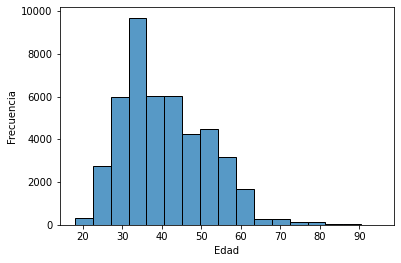

In [16]:
# histograma de la edad
sns.histplot(data = df, x = 'age', bins = 'sturges', palette = 'Paired')
plt.xlabel('Edad')#nombre eje x
plt.ylabel('Frecuencia')#nombre eje y
plt.show()

Distribución sesgada a derecha

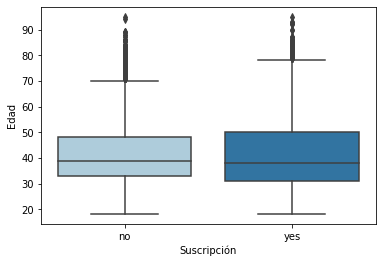

In [17]:
#boxplot de la edad según suscripción a deposito a plazo
sns.boxplot(x = 'y', y = 'age', data = df, palette = 'Paired')
plt.ylabel('Edad') #nombre eje x
plt.xlabel('Suscripción') #nombre eje y
plt.show()

Distribuciones similares

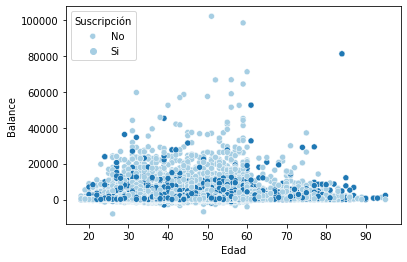

In [18]:
#Gráfico de dispersión de la edad y balance segun suscripción a depositos
sns.scatterplot(x = 'age', y = 'balance', hue = 'y', data = df, palette = 'Paired')  
plt.xlabel('Edad')#nombre eje x
plt.ylabel('Balance')#nombre eje y
plt.legend(['No', 'Si'], title = 'Suscripción')#nombre y categorías de la leyenda
plt.show()

Valores de balanca mas alto para menores de 70 

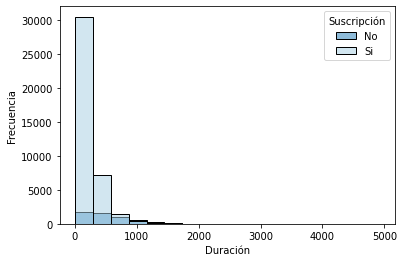

In [19]:
#Histograma de la duración segun la suscripción a depositos
sns.histplot(data = df, x = 'duration', hue = 'y', bins = 'sturges', palette = 'Paired')
plt.xlabel('Duración')#nombre eje x
plt.ylabel('Frecuencia')#nombre eje y
plt.legend(['No', 'Si'], title = 'Suscripción')#nombre y categorías de la leyenda
plt.show()

Cuanto mayor duración menor cantidad de suscripciones

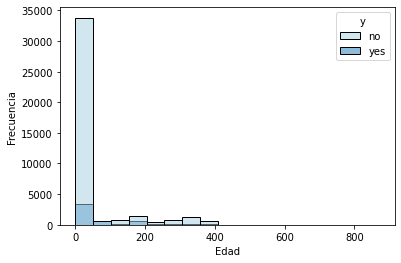

In [20]:
#Histograma del numero de dias transcurridos desde el contacto previo de la campaña anterior según la suscripción a depositos
sns.histplot(data = df, x = 'pdays', hue = 'y', bins = 'sturges', palette = 'Paired')
plt.xlabel('Edad')
plt.ylabel('Frecuencia')
plt.show()

No se puede observar mucho dado la alta frecuencia de -1

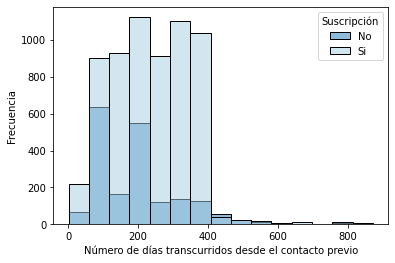

In [21]:
#Histograma del número de días transcurridos desde el contacto previo de la campaña anterior según la suscripción a depositos, sin personas no contactadas
sns.histplot(data = df[df['pdays'] != -1], x = 'pdays', hue = 'y', bins = 'sturges', palette = 'Paired')
plt.xlabel('Número de días transcurridos desde el contacto previo')
plt.ylabel('Frecuencia')
plt.legend(['No', 'Si'], title = 'Suscripción')
plt.show()

Menor número de días transcurridos, mayor cantidad de suscripciones

In [22]:
# Analisis de las personas no contactadas previamente
df[df['pdays'] == -1].head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


Veamos qué pasa con los valores unknown en poutcome, en los casos no contactados previamente

In [27]:
df.poutcome.value_counts()

unknown    36959
failure     4901
other       1840
success     1511
Name: poutcome, dtype: int64

In [28]:
df[df['pdays'] == -1]['poutcome'].value_counts()

unknown    36954
Name: poutcome, dtype: int64

La mayor cantidad de unknown se da cuando las personas no fueron contactadas previamente, lo cual tiene sentido dado que poutcome hace referencia al resultado de la campaña anterior

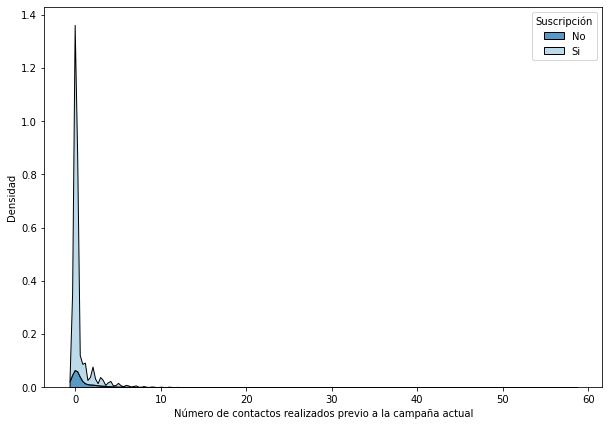

In [31]:
# Distribución del numero de contactos realizados previo a la campaña actual según la suscripción, quitando el valor atípico
plt.figure(figsize = (10,7))
sns.kdeplot(data = df[df.previous < 275], x = 'previous', hue = 'y', palette = 'Paired', multiple="stack")
plt.xlabel('Número de contactos realizados previo a la campaña actual')
plt.ylabel('Densidad')
plt.legend(['No', 'Si'], title = 'Suscripción')
plt.show()

Mayor cantidad de suscripciones a menor número de llamados

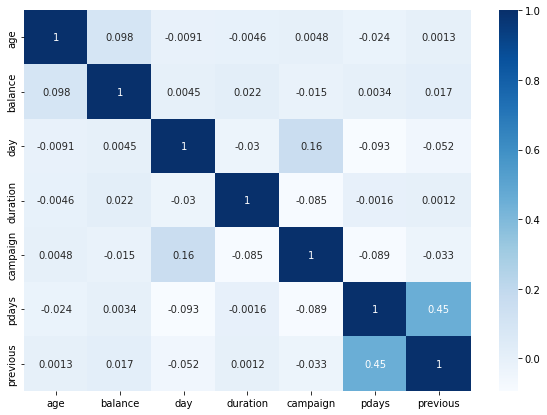

In [32]:
#Mapa de calor de las variables cuantitativas
plt.figure(figsize=(10,7))
sns.heatmap(data=df.corr(), annot=True, cmap = 'Blues')
plt.show()

Correlación media entre pdays y previous

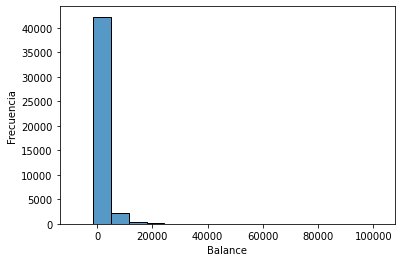

In [33]:
#Histograma del balance
sns.histplot(data = df, x = 'balance', bins = 'sturges', palette = 'Paired')
plt.xlabel('Balance')
plt.ylabel('Frecuencia')
plt.show()

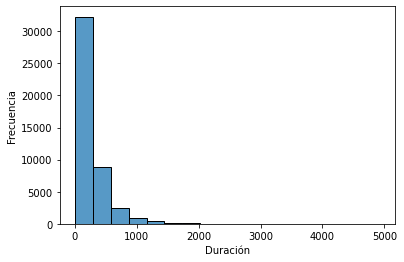

In [34]:
#Histograma de la duracion
sns.histplot(data = df, x = 'duration', bins = 'sturges', palette = 'Paired')
plt.xlabel('Duración')
plt.ylabel('Frecuencia')
plt.show()

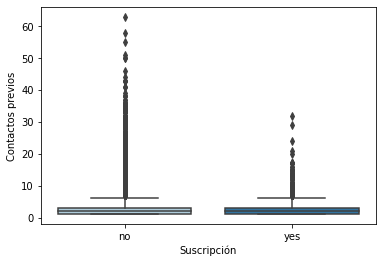

In [35]:
#boxplots del número de contactos durante la campaña actual según suscripciones
sns.boxplot(x = 'y', y = 'campaign', data = df, palette = 'Paired')
plt.ylabel('Contactos previos')
plt.xlabel('Suscripción')
plt.show()

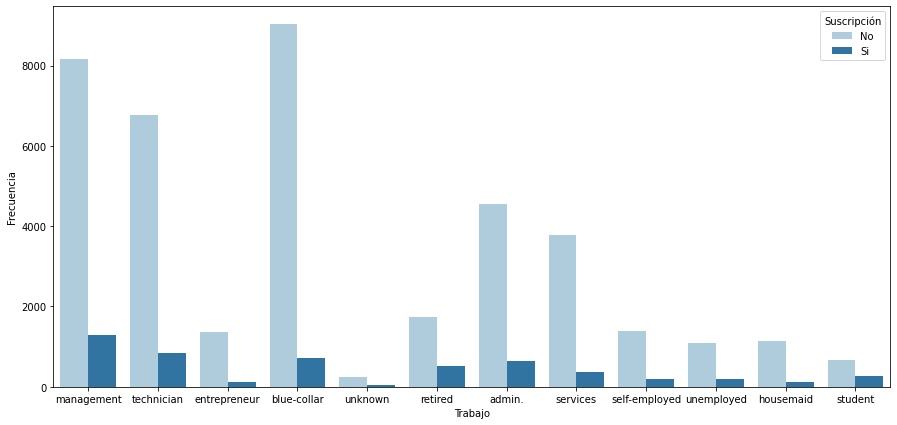

In [36]:
# Frecuencias de suscripciones según trabajo
plt.figure(figsize = (15,7))
sns.countplot(x = 'job', hue = 'y', data = df, palette = 'Paired')
plt.xlabel('Trabajo') #nombre eje x
plt.ylabel('Frecuencia') #nombre eje y
plt.legend(['No', 'Si'], title = 'Suscripción') #nombre y categorías de leyenda
plt.show()

Mayor cantidad de suscripciones en management, technician, blue-collar, retired, admin y services

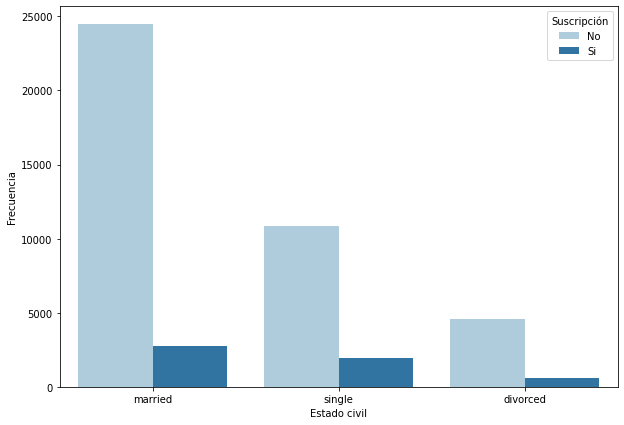

In [38]:
# Frecuencias de suscripciones según estado civil
plt.figure(figsize = (10,7))
sns.countplot(x = 'marital', hue = 'y', data = df, palette = 'Paired')
plt.xlabel('Estado civil')
plt.ylabel('Frecuencia')
plt.legend(['No', 'Si'], title = 'Suscripción')
plt.show()

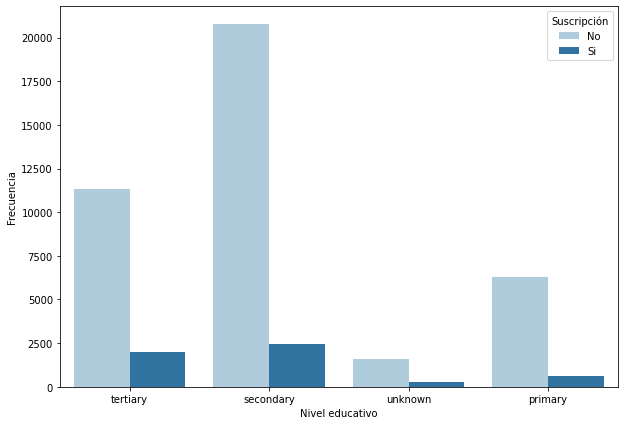

In [40]:
# Frecuencias de suscripciones según estado civil
plt.figure(figsize = (10,7))
sns.countplot(x = 'education', hue = 'y', data = df, palette = 'Paired')
plt.xlabel('Nivel educativo')
plt.ylabel('Frecuencia')
plt.legend(['No', 'Si'], title = 'Suscripción')
plt.show()

Mayor cantidad de susscripciones para nivel secundarios y terciario

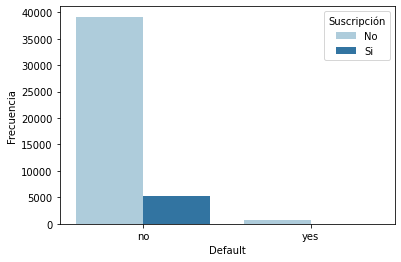

In [41]:
# Frecuencias de suscripciones según estado de default
sns.countplot(x = 'default', hue = 'y', data = df, palette = 'Paired')
plt.xlabel('Default')
plt.ylabel('Frecuencia')
plt.legend(['No', 'Si'], title = 'Suscripción')
plt.show()

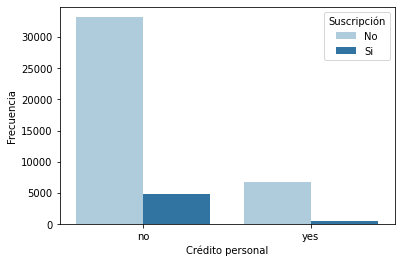

In [42]:
# Frecuencias de suscripciones según créditos personales
sns.countplot(x = 'loan', hue = 'y', data = df, palette = 'Paired')
plt.xlabel('Crédito personal')
plt.ylabel('Frecuencia')
plt.legend(['No', 'Si'], title = 'Suscripción')
plt.show()

Los clientes sin creditos personales tuvieron mayor frecuencia de suscripciones

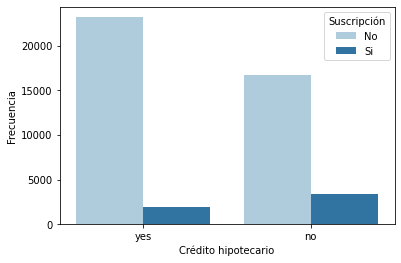

In [44]:
# Frecuencias de suscripciones según créditos hipotecarios
sns.countplot(x = 'housing', hue = 'y', data = df, palette = 'Paired')
plt.xlabel('Crédito hipotecario')
plt.ylabel('Frecuencia')
plt.legend(['No', 'Si'], title = 'Suscripción')
plt.show()

Los clientes sin creditos hipotecarios tuvieron mayor frecuencia de suscripciones

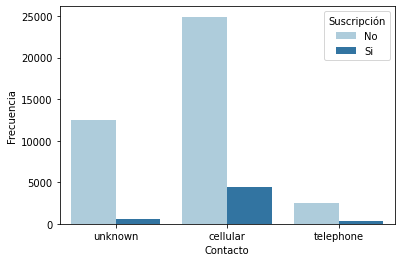

In [44]:
# Frecuencias de suscripciones según forma de contacto
sns.countplot(x = 'contact', hue = 'y', data = df, palette = 'Paired')
plt.xlabel('Contacto')
plt.ylabel('Frecuencia')
plt.legend(['No', 'Si'], title = 'Suscripción')
plt.show()

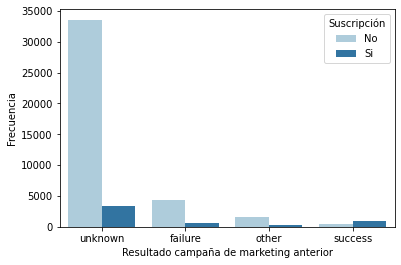

In [45]:
# Frecuencias de suscripciones según resultado campaña anterior
sns.countplot(x = 'poutcome', hue = 'y', data = df, palette = 'Paired')
plt.xlabel('Resultado campaña de marketing anterior')
plt.ylabel('Frecuencia')
plt.legend(['No', 'Si'], title = 'Suscripción')
plt.show()

Categoría unknown con mayoría de suscripciones. 
Dentro de las conocidas fue success

## 4. Conversión en categ. numéricas y reemplazo de valores unknown

In [46]:
# reemplazo de las variable que contenian "unknown" por None
unknown = []

for i in df.columns:
    if 'unknown' in df[i].unique():
        df[i] = df[i].replace({'unknown': None})
        unknown.append(i)

print(unknown)

['job', 'education', 'contact', 'poutcome']


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  """


Variables con valores unknown: job, education, contact, poutcome

In [47]:
# Creación de un listado con los nombres de las variables tipo string
str_col = []

for i in df.columns:
    if df[i].dtypes == 'object':
        str_col.append(i)

print(str_col)

['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome', 'y']


In [48]:
# Conversión a categorías numéricas de campos string
for i in str_col:
  df[i] = df[i].astype('category').cat.codes #conversion a categorias numericas
  if -1 in df[i].unique():
    df[i] = df[i].replace({-1: None}) #reemplazo del -1 por none

In [49]:
# Verificación de columnas con datos faltantes
df.isna().sum()

age              0
job            288
marital          0
education     1857
default          0
balance          0
housing          0
loan             0
contact      13020
day              0
month            0
duration         0
campaign         0
pdays            0
previous         0
poutcome     36959
y                0
dtype: int64

Valores faltantes en: job, education, contact y poutcome

## 5. Imputación de valores faltantes

In [50]:
# Carga de librerías
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer 
from sklearn.preprocessing import StandardScaler

In [51]:
# Se observa cuál es la moda de la variable poutcome
df['poutcome'].mode()

0    0
dtype: object

El cero es el valor mas frecuencia. Corresponde a failure

In [52]:
# hacemos la imputación de la moda
imp = SimpleImputer(missing_values = None, strategy = 'most_frequent')
df['poutcome'] = imp.fit_transform(df[['poutcome']])

In [53]:
# Chequeo de valores faltantes en la variable poutcome
df['poutcome'].isnull().sum()

0

No se observan más valores faltantes

In [55]:
#Estandarizamos el conjunto de datos, menos la variable respuesta
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df.loc[:, df.columns!='y'].to_numpy())
df_scaled = pd.DataFrame(df_scaled, columns=df.loc[:, df.columns!='y'].columns)

In [57]:
#realizamos la imputación
imp = KNNImputer(n_neighbors = 5, weights = 'distance')  
temp = imp.fit_transform(df_scaled)
df_2 = pd.DataFrame(temp, columns = df_scaled.columns)

In [58]:
# Chequeo de valores faltantes en el dataframe
df_2.isna().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
dtype: int64

No se observan valores faltantes

In [59]:
df_2.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,1.606965,-0.091709,-0.275762,1.279364,-0.13549,0.256419,0.893915,-0.436803,0.388178,-1.298476,0.823773,0.011016,-0.569351,-0.411453,-0.25194,-0.266514
1,0.288529,1.451876,1.368372,-0.223604,-0.13549,-0.437895,0.893915,-0.436803,-0.315011,-1.298476,0.823773,-0.416127,-0.569351,-0.411453,-0.25194,-0.266514
2,-0.747384,-0.709143,-0.275762,-0.223604,-0.13549,-0.446762,0.893915,2.289359,-0.315011,-1.298476,0.823773,-0.707361,-0.569351,-0.411453,-0.25194,-0.266514
3,0.571051,-1.017859,-0.275762,-1.135778,-0.13549,0.047205,0.893915,-0.436803,-0.315011,-1.298476,0.823773,-0.645231,-0.569351,-0.411453,-0.25194,-0.266514
4,-0.747384,0.069662,1.368372,0.030619,-0.13549,-0.447091,-1.118674,-0.436803,-0.315011,-1.298476,0.823773,-0.233620,-0.569351,-0.411453,-0.25194,-0.266514


In [79]:
#Desestandarizamos las variabless y le asignamos nombres a las columnas
df_original = scaler.inverse_transform(df_2)
df_original = pd.DataFrame(df_original, columns=df_2.columns)

In [80]:
#le agregamos la variable respuesta
df_original['y'] = df['y']
df_original.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58.0,4.000000,1.0,2.000000,0.0,2143.0,1.0,0.0,2.015153e-01,5.0,8.0,261.0,1.0,-1.0,0.0,0.0,0
1,44.0,9.000000,2.0,1.000000,0.0,29.0,1.0,0.0,0.000000e+00,5.0,8.0,151.0,1.0,-1.0,0.0,0.0,0
2,33.0,2.000000,1.0,1.000000,0.0,2.0,1.0,1.0,0.000000e+00,5.0,8.0,76.0,1.0,-1.0,0.0,0.0,0
3,47.0,1.000000,1.0,0.393086,0.0,1506.0,1.0,0.0,1.387779e-17,5.0,8.0,92.0,1.0,-1.0,0.0,0.0,0
4,33.0,4.522714,2.0,1.169148,0.0,1.0,0.0,0.0,1.387779e-17,5.0,8.0,198.0,1.0,-1.0,0.0,0.0,0


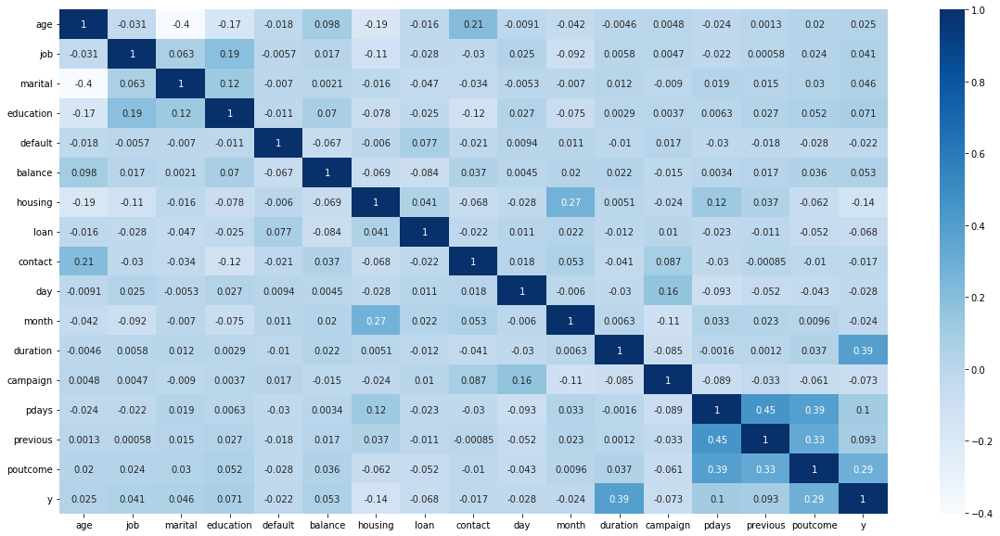

In [81]:
#Mapa de calor de todas las variables
plt.figure(figsize=(20,10))
sns.heatmap(data=df_original.corr(), annot=True, cmap='Blues')

Correlación entre duration y poutcomer con las variable y. poutcome con pdays y previous. previous con pdays

In [62]:
#redondeamos a valores enteros
df_original['job'] = round(df_original['job'], 0)
df_original['education'] = round(df_original['education'], 0)
df_original['poutcome'] = round(df_original['poutcome'], 0)
df_original['contact'] = round(df_original['contact'], 0)

In [63]:
#se convierte a variables categóricas
df_original['job'] = df_original['job'].astype('category')
df_original['education'] = df_original['education'].astype('category')
df_original['poutcome'] = df_original['poutcome'].astype('category')
df_original['contact'] = df_original['contact'].astype('category')
df_original['marital'] = df_original['marital'].astype('category')

#se recategorizan las variables a como estaban originalmente
df_original['job'] = df_original['job'].cat.rename_categories({0: 'admin.', 1: 'blue-collar', 2: 'entrepreneur', 3: 'housemaid', 4: 'management', 5: 'retired', 6: 'self-employed', 7: 'services', 8: 'student', 9: 'technician',
                                             10: 'unemployed'})
df_original['education'] = df_original['education'].cat.rename_categories({0: 'primary', 1: 'secondary', 2: 'tertiary'})
df_original['poutcome'] = df_original['poutcome'].cat.rename_categories({0: 'failure', 1: 'other', 2: 'successs'})
df_original['contact'] = df_original['contact'].cat.rename_categories({0: 'cellular', 1: 'telephone'})
df_original['marital'] = df_original['marital'].cat.rename_categories({0: 'divorced', 1: 'married', 2: 'single'})

In [64]:
#observamos las primeras filas para ver cómo quedó
df_original.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58.0,management,married,tertiary,0.0,2143.0,1.0,0.0,cellular,5.0,8.0,261.0,1.0,-1.0,0.0,failure,0
1,44.0,technician,single,secondary,0.0,29.0,1.0,0.0,cellular,5.0,8.0,151.0,1.0,-1.0,0.0,failure,0
2,33.0,entrepreneur,married,secondary,0.0,2.0,1.0,1.0,cellular,5.0,8.0,76.0,1.0,-1.0,0.0,failure,0
3,47.0,blue-collar,married,primary,0.0,1506.0,1.0,0.0,cellular,5.0,8.0,92.0,1.0,-1.0,0.0,failure,0
4,33.0,retired,single,secondary,0.0,1.0,0.0,0.0,cellular,5.0,8.0,198.0,1.0,-1.0,0.0,failure,0


## 6. Base de datos SQL y revisión final de la base de datos

In [65]:
# Carga de librerías
import pandas.io.sql as pd_sql # librería para escribir un archivo en formato db
import sqlite3 as sql 
import seaborn as sns

In [ ]:
conexion = sql.connect("df_tp.db") # creación de base sql
pd_sql.to_sql(df_original, 'base', conexion) # creación de tabla llamada base en la base de datos df_tp
conexion.close() #cerramos la conexión

In [70]:
# Conexión a la base de datos
base = sql.connect("df_tp.db")

In [71]:
# traemos la informacion de la tabla base
df_sql = base.execute('select * from base') 

In [72]:
# Creación de un dataframe para utilizar en python
data_sql = pd.DataFrame(data = df_sql)

In [73]:
# Revisión de las primeras 5 filas
data_sql.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0,58.0,management,married,tertiary,0.0,2143.0,1.0,0.0,cellular,5.0,8.0,261.0,1.0,-1.0,0.0,failure,0
1,1,44.0,technician,single,secondary,0.0,29.0,1.0,0.0,cellular,5.0,8.0,151.0,1.0,-1.0,0.0,failure,0
2,2,33.0,entrepreneur,married,secondary,0.0,2.0,1.0,1.0,cellular,5.0,8.0,76.0,1.0,-1.0,0.0,failure,0
3,3,47.0,blue-collar,married,primary,0.0,1506.0,1.0,0.0,cellular,5.0,8.0,92.0,1.0,-1.0,0.0,failure,0
4,4,33.0,retired,single,secondary,0.0,1.0,0.0,0.0,cellular,5.0,8.0,198.0,1.0,-1.0,0.0,failure,0


In [74]:
# Eliminación de la primera columna
data_sql = data_sql.drop(columns = 0)

In [75]:
# Renombre de las columnas del df a través del df que almacenamos en sql (opción 1)
data_sql.columns = df.columns

In [76]:
# Renombre de las columnas del df a través de una lista con sus nombres (opción 2)
data_sql.columns = ['age', 'job', 'marital',	'education',	'default',	'balance',	'housing',	'loan',	
                    'contact',	'day',	'month',	'duration',	'campaign',	'pdays',	'previous',	'poutcome',	'y']

In [77]:
# Revisión de las primeras 5 filas
data_sql.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58.0,management,married,tertiary,0.0,2143.0,1.0,0.0,cellular,5.0,8.0,261.0,1.0,-1.0,0.0,failure,0
1,44.0,technician,single,secondary,0.0,29.0,1.0,0.0,cellular,5.0,8.0,151.0,1.0,-1.0,0.0,failure,0
2,33.0,entrepreneur,married,secondary,0.0,2.0,1.0,1.0,cellular,5.0,8.0,76.0,1.0,-1.0,0.0,failure,0
3,47.0,blue-collar,married,primary,0.0,1506.0,1.0,0.0,cellular,5.0,8.0,92.0,1.0,-1.0,0.0,failure,0
4,33.0,retired,single,secondary,0.0,1.0,0.0,0.0,cellular,5.0,8.0,198.0,1.0,-1.0,0.0,failure,0


In [78]:
#Profile report de la base sin valores faltantes
ProfileReport(data_sql)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

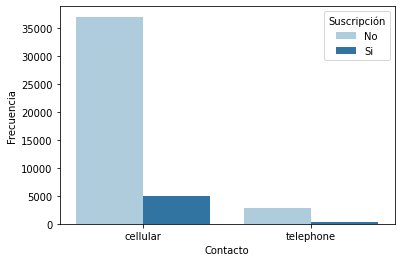

In [82]:
#Frecuencias de suscripciones por forma de contacto
sns.countplot(x = 'contact', hue = 'y', data = data_sql, palette = 'Paired')
plt.xlabel('Contacto')
plt.ylabel('Frecuencia')
plt.legend(['No', 'Si'], title = 'Suscripción')
plt.show()

Mayor cantidad de suscripciones por celular

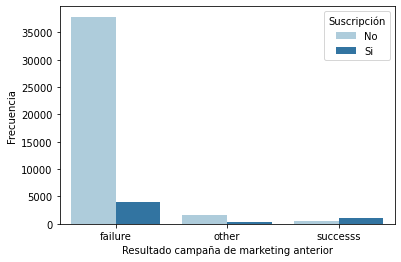

In [83]:
#Frecuencias de suscripciones por resultado de la campaña anterior
sns.countplot(x = 'poutcome', hue = 'y', data = data_sql, palette = 'Paired')
plt.xlabel('Resultado campaña de marketing anterior')
plt.ylabel('Frecuencia')
plt.legend(['No', 'Si'], title = 'Suscripción')
plt.show()

Mayor cantidad en failure

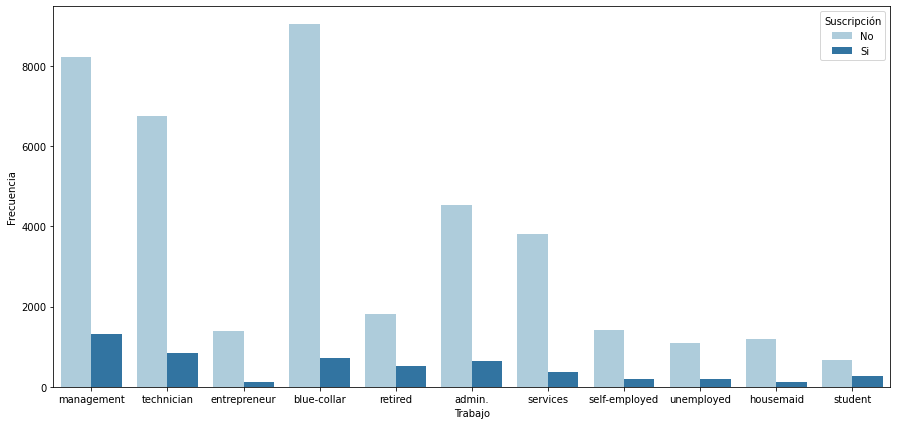

In [109]:
#Frecuencias de suscripciones por tipo de trabajo
plt.figure(figsize = (15,7))
sns.countplot(x = 'job', hue = 'y', data = data_sql, palette = 'Paired')
plt.xlabel('Trabajo')
plt.ylabel('Frecuencia')
plt.legend(['No', 'Si'], title = 'Suscripción')
plt.show()

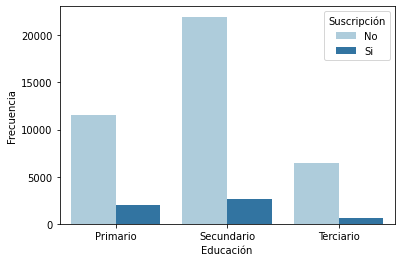

In [84]:
#Frecuencias de suscripciones por nivel educativo
sns.countplot(x = 'education', hue = 'y', data = data_sql, palette = 'Paired')
plt.xlabel('Educación')
plt.ylabel('Frecuencia')
plt.legend(['No', 'Si'], title = 'Suscripción')
plt.xticks(ticks=[0, 1, 2], labels=['Primario', 'Secundario', 'Terciario'])
plt.show()

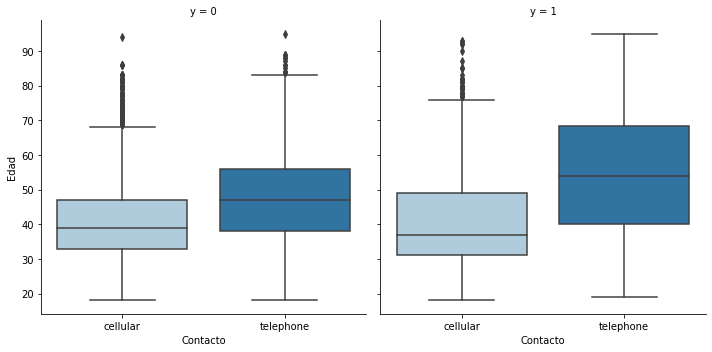

In [85]:
#Boxplor de las edades ssegun forma de contacto y suscripciones
plot = sns.catplot(data=data_sql, x = 'contact', y = 'age', col = 'y', kind = 'box', col_wrap = 2, palette = 'Paired')
plot.axes[0].set_xlabel('Contacto')
plot.axes[1].set_xlabel('Contacto')
plot.axes[0].set_ylabel('Edad')
plt.show()